In [3]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import openpyxl
import os
import networkx as nx
from urllib.request import urlopen
from bs4 import BeautifulSoup
import requests
from tqdm import tqdm
# import mpl_toolkits.basemap
os.getcwd()

'/Users/yungi/Documents/대학원졸업/seoul_vel'

In [2]:
slink_loc = pd.read_excel('Slink_Vertex_withGCS.xlsx', engine='openpyxl')

In [4]:
data_path = []
for dirname, _, filenames in os.walk('/Users/yungi/Documents/대학원졸업/seoul_vel'):
    for file in filenames:
        if file.endswith('txt', -3) or file.endswith('shp', -3):
            data_path.append(os.path.join(dirname, file))
        else:
            continue
data_path

['/Users/yungi/Documents/대학원졸업/seoul_vel/국토교통부_국가교통정보_표준노드링크_정보_20200916/MOCT_LINK.shp',
 '/Users/yungi/Documents/대학원졸업/seoul_vel/국토교통부_국가교통정보_표준노드링크_정보_20200916/MOCT_NODE.shp',
 '/Users/yungi/Documents/대학원졸업/seoul_vel/2021-02-15_NODELINKDATA/MOCT_LINK.shp',
 '/Users/yungi/Documents/대학원졸업/seoul_vel/2021-02-15_NODELINKDATA/MOCT_NODE.shp',
 '/Users/yungi/Documents/대학원졸업/seoul_vel/서울시통행속도데이터(202012_202102)/datasets/서울시_도로_구간별_5분속도_2021_02_21_28.txt',
 '/Users/yungi/Documents/대학원졸업/seoul_vel/서울시통행속도데이터(202012_202102)/datasets/서울시_도로_구간별_5분속도_202101_11_20.txt',
 '/Users/yungi/Documents/대학원졸업/seoul_vel/서울시통행속도데이터(202012_202102)/datasets/서울시_도로_구간별_5분속도_202012_01_10.txt',
 '/Users/yungi/Documents/대학원졸업/seoul_vel/서울시통행속도데이터(202012_202102)/datasets/서울시_도로_구간별_5분속도_202101_21_31.txt',
 '/Users/yungi/Documents/대학원

In [5]:
vel_data = pd.read_csv('/Users/yungi/Documents/대학원졸업/seoul_vel/서울시통행속도데이터(202012_202102)/datasets/서울시_도로_구간별_5분속도_2021_02_01_10.txt')
vel_data.head()

,PRCS_YEAR,PRCS_MON,PRCS_DAY,PRCS_HH,PRCS_MIN,LINK_ID,PRCS_SPD
0,2021,2,1,0,0,1020014000,22.81
1,2021,2,1,0,0,1020014100,27.14
2,2021,2,1,0,0,1020014200,31.32
3,2021,2,1,0,0,1020014300,17.00
4,2021,2,1,0,0,1020014400,32.00


In [5]:
vel_target = vel_data[(vel_data['PRCS_MON']==2) & (vel_data['PRCS_DAY']==1) & (vel_data['PRCS_HH']==9) & (vel_data['PRCS_MIN']==0)] # 1 Feb 2021, 오전 9시
vel_target.sort_values(by=['LINK_ID'], ascending=True, inplace=True) # sort 하고나면, index가 뒤죽박죽 됨.
vel_target = vel_target.reset_index().drop('index', axis=1) # 그래서, reset_index 메소드를 통해 index를 다시 리셋(0부터~(n-1)까지)하고, 이때 기존 index가 column('index'이름의 열)으로 넘어가는데, 이 쓸모없는 열을 drop한거임.
vel_target

,PRCS_YEAR,PRCS_MON,PRCS_DAY,PRCS_HH,PRCS_MIN,LINK_ID,PRCS_SPD
0,2021,2,1,9,0,1000000100,31.60
1,2021,2,1,9,0,1000000200,22.39
2,2021,2,1,9,0,1000000300,19.87
3,2021,2,1,9,0,1000000400,22.99
4,2021,2,1,9,0,1000000500,20.52
...,...,...,...,...,...,...,...
5033,2021,2,1,9,0,3201510100,9.00
5034,2021,2,1,9,0,3201510200,7.00
5035,2021,2,1,9,0,3201510300,11.00
5036,2021,2,1,9,0,3201510600,19.00


In [69]:
def percentile(n):
    def percentile_(x):
        return np.percentile(x, n)
    
    percentile_.__name__ = 'percentile_%s' %n  # 단지 함수이름 명목 (이 라인은 없어도 됨)
    return percentile_
    
test = vel_data[(vel_data['PRCS_MON']==2) & (vel_data['PRCS_DAY']==1)].groupby(by=['LINK_ID'], as_index=False) # grouby 객체에 .quantile(q) 메소드를 활용해도 되긴 된다. 0 <= q <= 1; ex) 95% : q = 0.95
test = test.agg({'PRCS_SPD':percentile(95)}) # .agg 메소드는 각 열마다 다른 함수를 적용시킬떄 쓸만함.
test

,LINK_ID,PRCS_SPD
0,1000000100,32.9020
1,1000000200,48.0000
2,1000000300,28.9980
3,1000000400,29.3905
4,1000000500,37.3980
...,...,...
5033,3201510100,35.0000
5034,3201510200,37.4400
5035,3201510300,25.0000
5036,3201510600,41.0000


In [6]:
maximal_vel = vel_data[(vel_data['PRCS_MON']==2) & (vel_data['PRCS_DAY']==1)].groupby(by=['LINK_ID'], as_index=False).quantile(0.95)
maximal_vel = maximal_vel.loc[:, (maximal_vel.columns != 'PRCS_HH') & (maximal_vel.columns != 'PRCS_MIN')]
maximal_vel[['PRCS_YEAR', 'PRCS_MON', 'PRCS_DAY']] = maximal_vel[['PRCS_YEAR', 'PRCS_MON', 'PRCS_DAY']].apply(lambda x: x.astype('int64'))
maximal_vel.rename(columns={'PRCS_SPD':'LMV'}, inplace=True) # LMV = Limited Maximal Velocity ( 95th percentile of its velocity in Feb 1, 2021 )
maximal_vel

,LINK_ID,PRCS_YEAR,PRCS_MON,PRCS_DAY,LMV
0,1000000100,2021,2,1,32.9020
1,1000000200,2021,2,1,48.0000
2,1000000300,2021,2,1,28.9980
3,1000000400,2021,2,1,29.3905
4,1000000500,2021,2,1,37.3980
...,...,...,...,...,...
5033,3201510100,2021,2,1,35.0000
5034,3201510200,2021,2,1,37.4400
5035,3201510300,2021,2,1,25.0000
5036,3201510600,2021,2,1,41.0000


In [7]:
print('최대속도 도로링크 중에서도 가장 빠른 속도 : ', maximal_vel['LMV'].max(), '\n최대속도 도로링크 중에서도 가장 느린 속도 : ', maximal_vel['LMV'].min())

최대속도 도로링크 중에서도 가장 빠른 속도 :  111.0 
최대속도 도로링크 중에서도 가장 느린 속도 :  0.0


In [8]:
zero_velmax = maximal_vel[maximal_vel['LMV']==0]['LINK_ID'].values
zero_velmax # 하루 중 95% percentile 통행속도 값이 0 인 도로들; 아마도 어떤 연유로 인해 관측이 잘 안된 도로로 분류 -> Unobservable 로 분류

array([1050048100, 1050048200, 1140026200, 1140029100, 1140029200,
       1140040700, 1150162801, 2040002902])

In [19]:
# 95% percentile이 0인 도로들에 대한 '하루 중 통행속도'의 정보를 살펴보면, 
# 어떤 값들은 24시간(288개; 5분 resolution ) 동안 관측된 최대 속도(max)가 0이거나, 최대값에 비해 평균이 터무니없이 작고 평균 근처에 대부분 분포해 있는 데이터들이다.
for zero_vel in zero_velmax:
    print('LINK_ID = {} >>>'.format(zero_vel))
    print(vel_data[(vel_data['PRCS_MON']==2) & (vel_data['PRCS_DAY']==1)][vel_data['LINK_ID']==zero_vel].describe()['PRCS_SPD'])
    print()

LINK_ID = 1050048100 >>>
count    288.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PRCS_SPD, dtype: float64

LINK_ID = 1050048200 >>>
count    288.000000
mean       1.762604
std        8.190323
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max       45.230000
Name: PRCS_SPD, dtype: float64

LINK_ID = 1140026200 >>>
count    288.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PRCS_SPD, dtype: float64

LINK_ID = 1140029100 >>>
count    288.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PRCS_SPD, dtype: float64

LINK_ID = 1140029200 >>>
count    288.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: PRCS_SPD, dtype: float64

LINK_ID = 1140040700 >>>
count    288.0
mean       0.0
std        0.0
min  

In [10]:
vel_target['LINK_ID'].unique()

array([1000000100, 1000000200, 1000000300, ..., 3201510300, 3201510600,
       3201510700])

In [11]:
maximal_vel['LINK_ID'].unique()

array([1000000100, 1000000200, 1000000300, ..., 3201510300, 3201510600,
       3201510700])

In [12]:
all(vel_target['LINK_ID'].unique() == maximal_vel['LINK_ID'].unique())

True

In [33]:
vel_target['ratio'] = vel_target['PRCS_SPD'] / maximal_vel['LMV']
vel_target[vel_target['LINK_ID'].isin(zero_velmax)] # .isin(A) 메소드는 A라는 곳에 값이 포함되어 있는지를 검사하는 메소드다. 엄청 자주쓰임. in 이라는 빌트인 operator보다 pandas 에서는 isin을 쓰자.

,PRCS_YEAR,PRCS_MON,PRCS_DAY,PRCS_HH,PRCS_MIN,LINK_ID,PRCS_SPD,ratio
1128,2021,2,1,9,0,1050048100,0.0,NaN
1129,2021,2,1,9,0,1050048200,0.0,NaN
2626,2021,2,1,9,0,1140026200,0.0,NaN
2642,2021,2,1,9,0,1140029100,0.0,NaN
2643,2021,2,1,9,0,1140029200,0.0,NaN
2710,2021,2,1,9,0,1140040700,0.0,NaN
2913,2021,2,1,9,0,1150162801,0.0,NaN
4932,2021,2,1,9,0,2040002902,0.0,NaN


In [34]:
vel_target['ratio'].describe()

count    5030.000000
mean        0.588024
std         0.195812
min         0.000000
25%         0.454002
50%         0.593916
75%         0.727736
max         1.234286
Name: ratio, dtype: float64

In [35]:
vel_target

,PRCS_YEAR,PRCS_MON,PRCS_DAY,PRCS_HH,PRCS_MIN,LINK_ID,PRCS_SPD,ratio
0,2021,2,1,9,0,1000000100,31.60,0.960428
1,2021,2,1,9,0,1000000200,22.39,0.466458
2,2021,2,1,9,0,1000000300,19.87,0.685220
3,2021,2,1,9,0,1000000400,22.99,0.782226
4,2021,2,1,9,0,1000000500,20.52,0.548692
...,...,...,...,...,...,...,...,...
5033,2021,2,1,9,0,3201510100,9.00,0.257143
5034,2021,2,1,9,0,3201510200,7.00,0.186966
5035,2021,2,1,9,0,3201510300,11.00,0.440000
5036,2021,2,1,9,0,3201510600,19.00,0.463415


In [20]:
slink_loc.head()

,link_id,ver_seq,grs80tm_x,grs80tm_y,lon,lat
0,1000000100,1,197521.131469,452291.143788,126.971940,37.570158
1,1000000100,2,197476.397972,452270.601508,126.971434,37.569973
2,1000000100,3,197396.282962,452205.291085,126.970527,37.569384
3,1000000100,4,197282.329009,452103.185089,126.969238,37.568464
4,1000000200,1,197290.336956,452094.247932,126.969329,37.568383


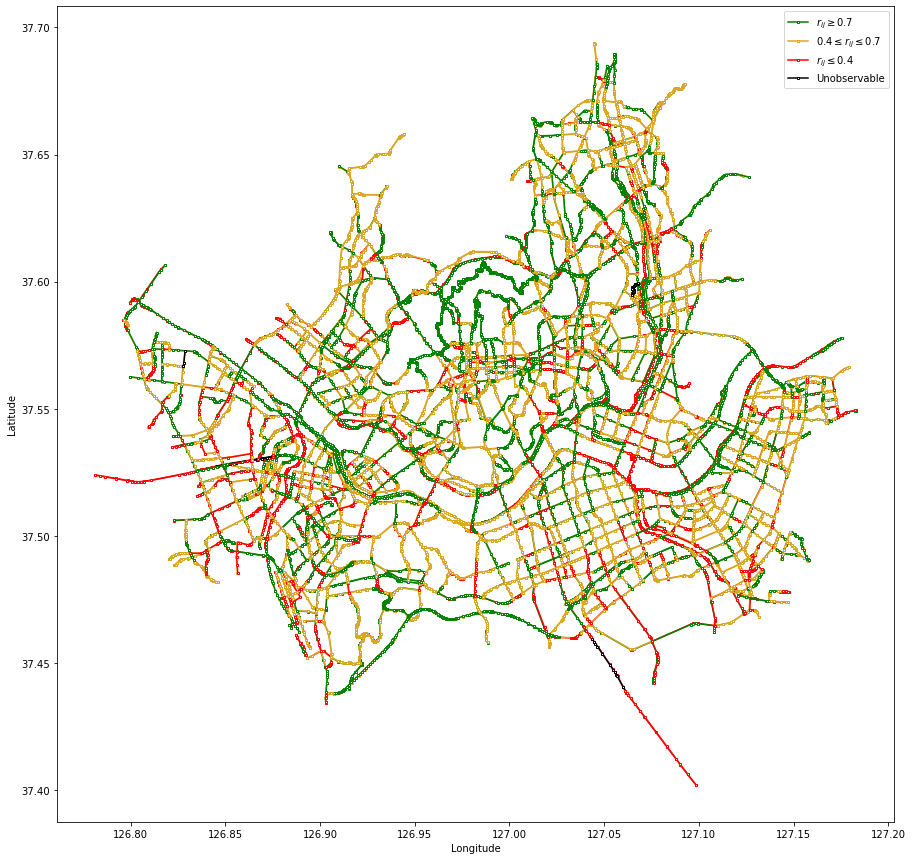

In [86]:
non_plot = []
flag = {'black':True, 'red':True, 'goldenrod':True, 'green':True}

fig = plt.figure(figsize=(15,15))
for sid in vel_target['LINK_ID'].values:
    target_row = vel_target[vel_target['LINK_ID']==sid]
    if slink_loc[slink_loc['link_id']==sid].empty:
        non_plot.append(sid)
        continue

    x = slink_loc[slink_loc['link_id']==sid]['lon']
    y = slink_loc[slink_loc['link_id']==sid]['lat']
    
    if target_row['ratio'].isna().values:
        label = 'Unobservable'
        color = 'black'
        if flag[color]:
            plt.plot(x, y, color=color, label=label, marker='s', markerfacecolor='white', markersize=2)
            flag[color] = False
            continue

        plt.plot(x, y, color=color, marker='s', markerfacecolor='white', markersize=2)
        continue
    
    ratio = target_row['ratio'].values
    if ratio <= 0.4:
        label = r'$r_{ij}  \leq  0.4$'
        color = 'red'
        if flag[color]:
            plt.plot(x, y, color=color, label=label, marker='s', markerfacecolor='white', markersize=2)
            flag[color] = False
            continue
    
    elif (ratio >= 0.4) & (ratio <= 0.7):
        label = r'$0.4  \leq  r_{ij}  \leq  0.7$'
        color = 'goldenrod'
        if flag[color]:
            plt.plot(x, y, color=color, label=label, marker='s', markerfacecolor='white', markersize=2)
            flag[color] = False
            continue

    elif ratio >= 0.7:
        label = r'$r_{ij}  \geq  0.7$'
        color = 'green'
        if flag[color]:
            plt.plot(x, y, color=color, label=label, marker='s', markerfacecolor='white', markersize=2)
            flag[color] = False
            continue

    plt.plot(x, y, color=color, marker='s', markerfacecolor='white', markersize=2)

plt.legend()
plt.xlabel('Longitude')
plt.ylabel('Latitude')
# plt.savefig('SeoulRoad_Efficiency_for_ratio_R_ij(LMV).pdf', bbox_inches='tight', pad_inches=0)
plt.show()

In [87]:
non_plot

[1000015300, 1000015400]

In [22]:
class api_reader:
    def __init__(self):
        self.linkids = []
        self.unknownIDs = []
        self.MY_OPEN_KEY = "6c595368467a6f733130385049594369"
        self.BASE_URL = "http://openapi.seoul.go.kr:8088"
        self.API = ['LinkInfo','trafficMlrdLinkInfo','LinkVerInfo','LinkWithLoad']
        self.API_OUTPUT = {'LinkVerInfo':['link_id', 'ver_seq', 'grs80tm_x', 'grs80tm_y'], 'LinkInfo':['link_id', 'road_name', 'st_node_nm', 'ed_node_nm']}
        
    def enroll_slink(self, linkid):
        if hasattr(linkid, '__len__') and (not isinstance(linkid, str)):
            self.linkids = linkid

        else:
            self.linkids = np.array([linkid])
        
        return print("{} ID(s) Succesfully Enrolled".format(len(self.linkids)))

    def url_request(self, api, linkid, startNum=1, endNum=500):
        if api not in self.API:
            raise Exception("고딴 API는 없습니다.")

        url = self.BASE_URL + "/" + self.MY_OPEN_KEY + "/xml/" + api + "/" + str(startNum) + "/" + str(endNum) + "/" + str(linkid) + "/"
        req = requests.get(url)
        return req

    def parser(self, api):
        if len(self.linkids) == 0:
            raise Exception("Link ID가 등록되지 않았습니다. enroll_slink(linkid) 메소드를 활용하세요.")
        
        data = {}
        for link in tqdm(self.linkids):
            req = self.url_request(api, link)
            html = req.text
            soup = BeautifulSoup(html, 'html.parser')

            status = soup.find_all('message')[0].text
            if "정상 처리되었습니다" != status:
                print("처리할 수 없는 ID 발견 : {} // self.unknownIDs 에서 확인할 것".format(link))
                self.unknownIDs.append(int(link))
                continue

            for each_attr in self.API_OUTPUT[api]:
                finded_attr = soup.find_all(each_attr)
                if data.get(each_attr) == None:
                    data[each_attr] = [x.text for x in finded_attr]
                else:
                    data[each_attr] = data[each_attr] + [x.text for x in finded_attr]
        
        df = pd.DataFrame(data)
        if 'link_id' in self.API_OUTPUT[api] and not df.empty:
            df['link_id'] = df['link_id'].apply(lambda x: int(x))

        return df



In [26]:
linkInfo = api_reader()

In [27]:
linkInfo.enroll_slink(vel_data['LINK_ID'].unique())

5038 ID(s) Succesfully Enrolled


In [28]:
df = linkInfo.parser('LinkInfo')

100%|██████████| 5038/5038 [19:16<00:00,  4.36it/s]


In [56]:
empty_linkinfo = linkInfo.unknownIDs
empty_linkinfo

[1000015300, 1000015400]

In [71]:
for empt_link in empty_linkinfo:
    if df[df['link_id']==empt_link].empty:
        df = df.append({'link_id':empt_link}, ignore_index=True)

else:
    print("Loop End")
    if (df.shape[0] == vel_target.shape[0]) & ('ratio' not in df.columns):
        df = df.sort_values(by=['link_id'], ascending=True)
        df = df.reset_index().drop('index', axis=1)
        df['link_id'] = df[['link_id']].apply(lambda x: x.astype('int64'))
        df['ratio'] = vel_target['ratio'].values
    
    else:
        print("Nothing to update")

# df.to_excel('STnodeLinks_withRatio.xlsx', index=False)
df


Loop End
Nothing to update


,link_id,road_name,st_node_nm,ed_node_nm,ratio
0,1000000100,새문안로,서울역사박물관,정동사거리,0.960428
1,1000000200,새문안로,정동사거리,서울역사박물관,0.466458
2,1000000300,종로,종로구청입구,종로1가,0.685220
3,1000000400,종로,종로1가,종로구청입구,0.782226
4,1000000500,종로,종로2가,종로1가,0.548692
...,...,...,...,...,...
5033,3201510100,디지털로,철산대교(동단),디지털3단지,0.257143
5034,3201510200,토정로,서울신용평가정보,상수동사거리,0.186966
5035,3201510300,토정로,상수동사거리,서울신용평가정보,0.440000
5036,3201510600,토정로,상수동사거리,당인리발전소,0.463415


In [6]:
def extract_ratio_df(node_df, month, day, hour, minute):
    vel_df = vel_data[(vel_data['PRCS_MON']==month) & (vel_data['PRCS_DAY']==day) & (vel_data['PRCS_HH']==hour) & (vel_data['PRCS_MIN']==minute)]
    if vel_df.empty:
        return print("Wrong Input, Be sure that (month, day, hour, minute) is correct.")

    vel_df.sort_values(by=['LINK_ID'], ascending=True, inplace=True)
    vel_df = vel_df.reset_index().drop('index', axis=1)

    LMV_df = vel_data[(vel_data['PRCS_MON']==month) & (vel_data['PRCS_DAY']==day)].groupby(by=['LINK_ID'], as_index=False).quantile(0.95)
    LMV_df = LMV_df.loc[:, (LMV_df.columns != 'PRCS_HH') & (LMV_df.columns != 'PRCS_MIN')]
    LMV_df[['PRCS_YEAR', 'PRCS_MON', 'PRCS_DAY']] = LMV_df[['PRCS_YEAR', 'PRCS_MON', 'PRCS_DAY']].apply(lambda x: x.astype('int64'))
    LMV_df.rename(columns={'PRCS_SPD':'LMV'}, inplace=True) # LMV = Limited Maximal Velocity ( 95th percentile of its velocity in Feb 1, 2021 )
    
    if 'ratio' in df.columns:
        node_df = node_df.drop('ratio', axis=1)
        
    node_df['ratio'] = vel_df['PRCS_SPD'] / LMV_df['LMV']        

    return node_df



In [7]:
df = pd.read_excel('STnodeLinks_withRatio.xlsx', engine='openpyxl')
G_set = []
SG_set = []
month = 2
day = 1
target_time = [(6,0), (7,20), (9,30), (11,40)] # (hour, minute); maximum four targets

expected_threshold = {}

q_range = np.linspace(0, 1, 101)
for hour, minute in tqdm(target_time):
    target_df = extract_ratio_df(df, month, day, hour, minute)
    first_comp = []
    second_comp = []
    for q_cand in q_range:
        comp_list = []
        target_df = target_df[target_df['ratio']>q_cand]
        st_node = target_df['st_node_nm'].values
        ed_node = target_df['ed_node_nm'].values
        graph = nx.DiGraph()
        graph.add_edges_from(zip(st_node, ed_node))
        for component in nx.strongly_connected_components(graph):
            comp_list.append(list(component))
        
        comp_list.sort(key=len, reverse=True)
        first_comp.append(len(comp_list[0]))
        second_comp.append(len(comp_list[1]))

    G_set.append(first_comp)
    SG_set.append(second_comp)

    q_set = list(zip(q_range, second_comp))
    q_set.sort(key = lambda x: x[1], reverse=True)
    temp_name = str(month) + str(day) + str(hour) + str(minute)
    expected_threshold[temp_name] = q_set[0][0]


100%|██████████| 4/4 [00:10<00:00,  2.56s/it]


In [8]:
expected_threshold

{'2160': 0.7000000000000001, '21720': 0.64, '21930': 0.45, '211140': 0.48}

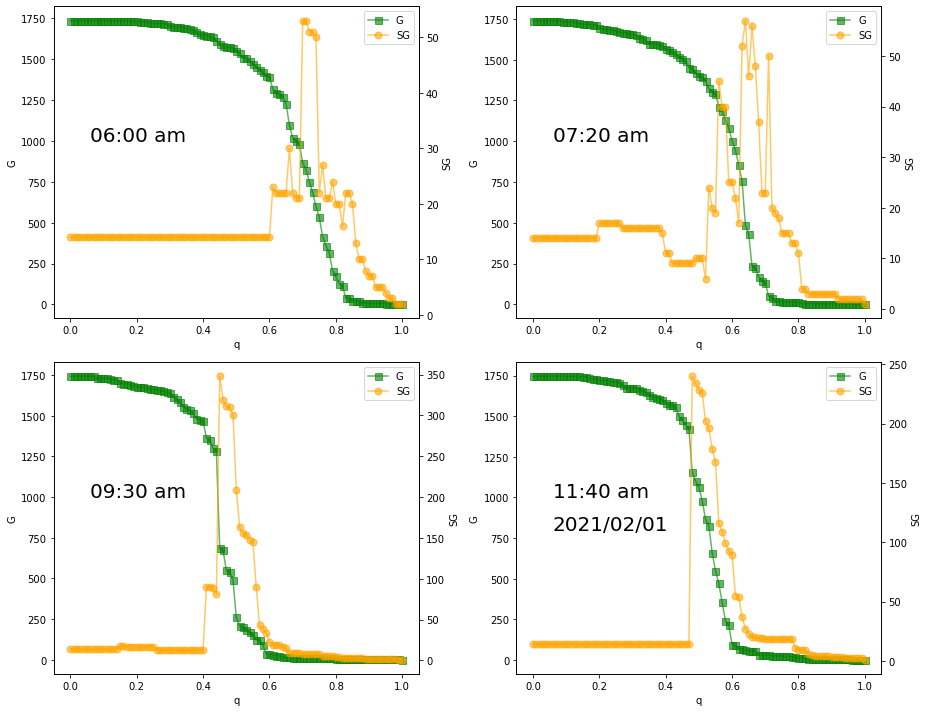

In [9]:
cnt = 0
time_text = ['06:00 am', '07:20 am', '09:30 am', '11:40 am']

fig, axs = plt.subplots(2, 2, figsize=(13,10))
for ax_row in axs:
    for ax in ax_row:
        ax1 = ax.twinx()
        G = G_set[cnt]
        SG = SG_set[cnt]
        ax.text(0.06, 1000, time_text[cnt], size=20)
        if cnt == 3:
            ax.text(0.06, 800, '2021/02/01', size=20)
        G_plot = ax.plot(q_range, G, markersize=7, c='green', marker="s", alpha=0.6, label='G')
        SG_plot = ax1.plot(q_range, SG, markersize=7, c='orange', marker="o", alpha=0.6, label='SG')
        lns = G_plot + SG_plot
        labs = [l.get_label() for l in lns]
        ax.legend(lns, labs, loc='upper right')
        ax.set_xlabel('q')
        ax.set_ylabel('G')
        ax1.set_ylabel('SG')
        cnt += 1

fig.tight_layout()
plt.show()

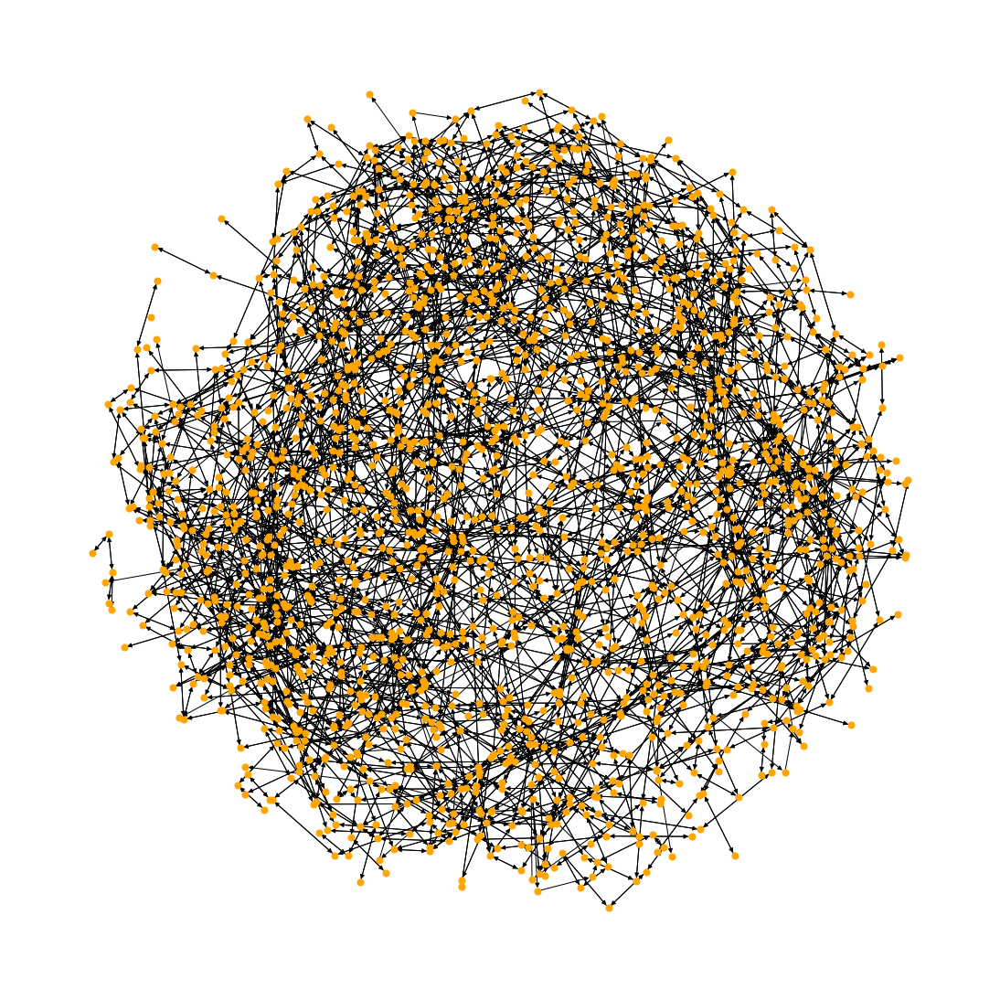

In [233]:
st_node = df['st_node_nm'].values
ed_node = df['ed_node_nm'].values
# print(st_node)
entire_graph = nx.DiGraph()
entire_graph.add_edges_from(zip(st_node, ed_node))
my_pos = nx.spring_layout(entire_graph, seed=100, k=4/np.sqrt(entire_graph.order()))
plt.figure(figsize=(15,15))
nx.draw(entire_graph, pos=my_pos, with_labels=False, node_color='orange', node_size=50, edge_color='black', linewidths=1)

In [ ]:
first_component = []
second_component = []
expected_threshold = []

q_range = np.linspace(0, 1, 101)
for threshold in tqdm(q_range):
    comp_list = []
    df1 = df[df['ratio']>threshold]
    st_node = df1['st_node_nm'].values
    ed_node = df1['ed_node_nm'].values
    graph = nx.DiGraph()
    graph.add_edges_from(zip(st_node, ed_node))
    for component in nx.strongly_connected_components(graph):
        comp_list.append(list(component))
    
    comp_list.sort(key=len, reverse=True)
    first_component.append(len(comp_list[0]))
    second_component.append(len(comp_list[1]))

q_set = list(zip(q_range, second_component))
q_set.sort(key = lambda x: x[1], reverse=True)
expected_threshold.append(q_set[0][0])

fig, ax1 = plt.subplots(figsize=(5,5))
ax1_1 = ax1.twinx()
ax1.text(0.7, 1250, '09:00am', size=15)
G_plot = ax1.plot(q_range, first_component, markersize=7, c='green', marker="s", alpha=0.7, label='G')
SG_plot = ax1_1.plot(q_range, second_component, markersize=7, c='orange', marker="o", alpha=0.7, label='SG')
lns = G_plot + SG_plot
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, loc='upper right')
# plt.legend(loc='upper right')
ax1.set_xlabel('q')
ax1.set_ylabel('G')
ax1_1.set_ylabel('SG')
plt.show()

In [143]:
entire_graph.order()

1814

In [142]:
for comp in nx.strongly_connected_components(entire_graph):
    print(len(co

1
1
1
1
1
1756
1
4
3
5
1
1
4
14
1
2
1
5
9
1
1


In [ ]:
# All nodes is fixed with the same positions.
my_pos = nx.spring_layout(G, seed = 100)
nx.draw(G, pos = my_pos, with_labels=True, node_color='orange', node_size=400, edge_color='black', linewidths=1, font_size=15)
plt.show()

100%|██████████| 5038/5038 [00:09<00:00, 535.75it/s]
{}


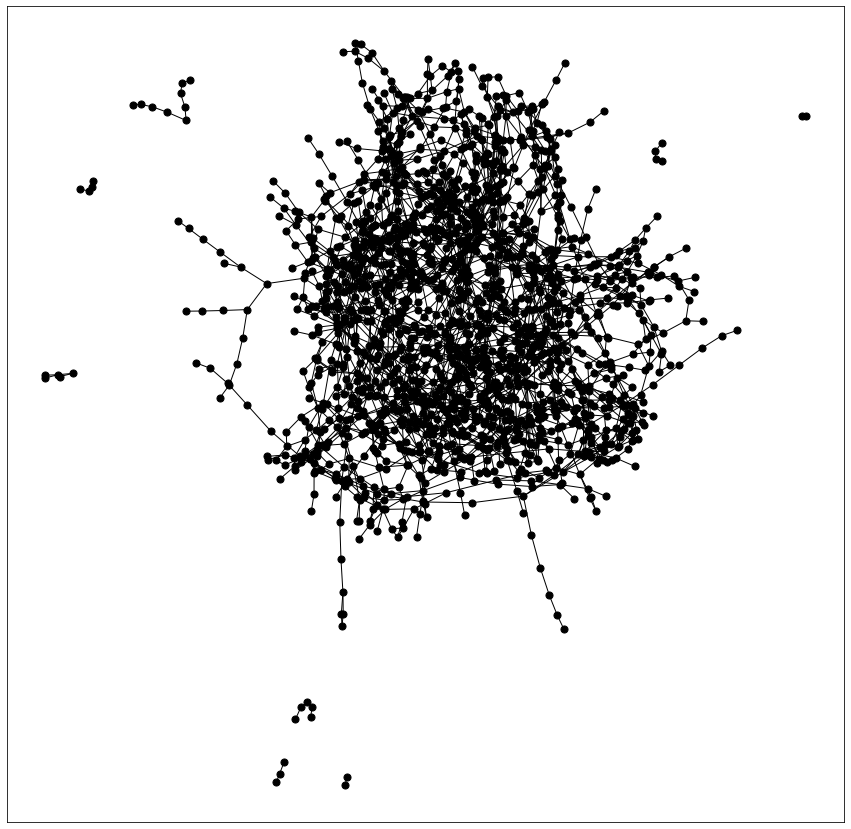

In [214]:
G = nx.Graph()

cnt = 0
for link_id in tqdm(df['link_id'].values):
    # add node to Graph G
    index = df[df['link_id']==link_id].index[0]
    if df[df['link_id']==link_id]['road_name'].isna()[index]:
        continue
     
    S_lat, S_lon = slink_loc[slink_loc['link_id']==link_id].loc[:,['lat','lon']].values[0]
    T_lat, T_lon = slink_loc[slink_loc['link_id']==link_id].loc[:,['lat','lon']].values[-1]
    Source = df[df['link_id']==link_id]['st_node_nm'][index]
    Target = df[df['link_id']==link_id]['ed_node_nm'][index]
    RoadName = df[df['link_id']==link_id]['road_name'][index]

    G.add_node(Source, Label=RoadName, latitude=S_lat, longitude=S_lon)
    G.add_node(Target, latitude=T_lat, longitude=T_lon)

cnt = 0
for link_id in tqdm(df['link_id'].values):
    # add node to Graph G
    index = df[df['link_id']==link_id].index[0]
    if df[df['link_id']==link_id]['road_name'].isna()[index]:
        continue

    Source = df[df['link_id']==link_id]['st_node_nm'][index]
    Target = df[df['link_id']==link_id]['ed_node_nm'][index]

    G.add_edge(Source, Target)

plt.figure(figsize=(15,15))
print(nx.get_node_attributes(G, 'pos'))
nx.draw_networkx(G, node_size=50, with_labels=False, node_color='black')


In [216]:
print(nx.info(G))

Name: 
Type: Graph
Number of nodes: 1813
Number of edges: 2626
Average degree:   2.8969


In [ ]:
m = Basemap(projection='merc',llcrnrlon=-180,llcrnrlat=10,urcrnrlon=-50, urcrnrlat=70, lat_ts=0, resolution='l', suppress_ticks=True)

100%|██████████| 5038/5038 [00:03<00:00, 1409.94it/s]
Name: 
Type: Graph
Number of nodes: 1812
Number of edges: 2623
Average degree:   2.8951


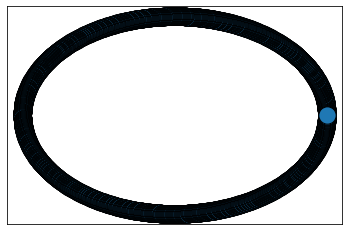

In [175]:
G = nx.Graph()

for link_id in tqdm(df1['link_id'].values):
    target_row = df1[df1['link_id']==link_id]
    if target_row['ratio'].isna().values:
        continue
    
    idx = target_row.index[0]
    if target_row['ratio'].values <= 0.4:
        color = 'red'
        G.add_edge(target_row['st_node_nm'][idx], target_row['ed_node_nm'][idx], color=color)
        continue

    elif (target_row['ratio'].values > 0.4) & (target_row['ratio'].values < 0.7):
        color = 'goldenrod'
        G.add_edge(target_row['st_node_nm'][idx], target_row['ed_node_nm'][idx], color=color)
        continue

    elif target_row['ratio'].values >= 0.7:
        color = 'green'
        G.add_edge(target_row['st_node_nm'][idx], target_row['ed_node_nm'][idx], color=color)
        continue

colors = nx.get_edge_attributes(G,'color').values()
print(nx.info(G))
pos = nx.circular_layout(G)
nodes = nx.draw_networkx_nodes(G, pos)
nodes.set_edgecolor('black')
# plt.gca()
# plt.figure(figsize=(15, 15))
#nx.draw(G, pos, edge_color=colors, with_labels=False, node_color='white')






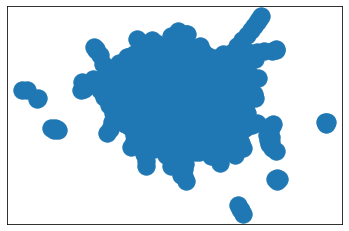

In [85]:
g = nx.from_pandas_edgelist(df, source='st_node_nm', target='ed_node_nm')
nx.draw_networkx(g, with_labels=False)

In [119]:
vel_target

,PRCS_YEAR,PRCS_MON,PRCS_DAY,PRCS_HH,PRCS_MIN,LINK_ID,PRCS_SPD,ratio
0,2021,2,1,9,0,1000000100,31.60,0.960428
1,2021,2,1,9,0,1000000200,22.39,0.466458
2,2021,2,1,9,0,1000000300,19.87,0.685220
3,2021,2,1,9,0,1000000400,22.99,0.782226
4,2021,2,1,9,0,1000000500,20.52,0.548692
...,...,...,...,...,...,...,...,...
5033,2021,2,1,9,0,3201510100,9.00,0.257143
5034,2021,2,1,9,0,3201510200,7.00,0.186966
5035,2021,2,1,9,0,3201510300,11.00,0.440000
5036,2021,2,1,9,0,3201510600,19.00,0.463415


[(1, 1), (2, 2), (3, 1)]


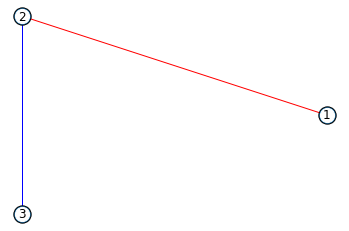

In [174]:
g = nx.Graph()
g.add_edge(1,2,color='r')
g.add_edge(2,3,color='b')
colors = nx.get_edge_attributes(g,'color').values()
pos = nx.circular_layout(g)
nodes = nx.draw_networkx_nodes(g, pos)
nodes.set_edgecolor('black')
d = nx.degree(g)
print(d)
nx.draw(g, pos, node_size=200, edge_color=colors, with_labels=True, node_color='white')

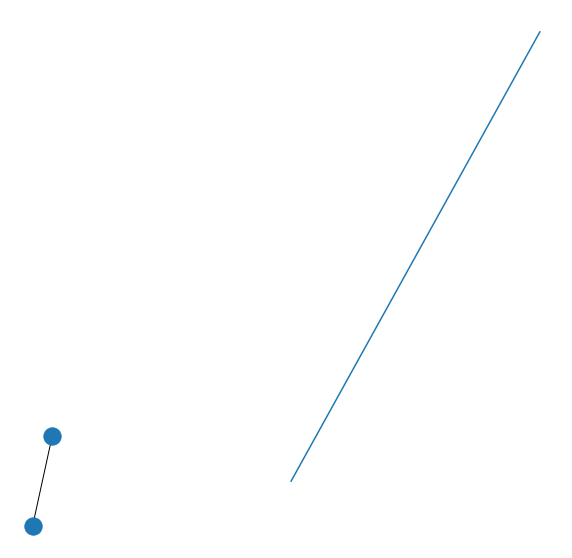

In [213]:
plt.figure(figsize=(10,10))
plt.plot([20,10],[10,0])
g = nx.Graph()
g.add_node(1,label='hey', pos=(20, 10))
g.add_node(2,label='you', pos=(10, 0))
g.add_edge(1,2)
nx.draw(g)
plt.show()

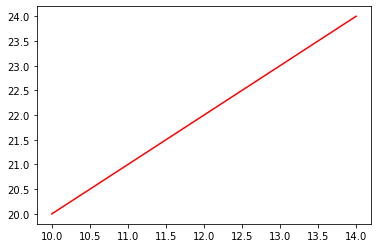

In [210]:
plt.figure()
plt.plot([10,11,12,13,14], [20,21,22,23,24], color='red')
plt.show()